In [1]:
# Import basic packages
import numpy as np
import pandas as pd
# Import data processing package
from DataProcessing import *
# Import plot packages
from gspplot import *
import matplotlib as mpl
# Import graph packages
import gsp
import networkx as nx
# Import other packages
import warnings; warnings.filterwarnings('ignore')

# 1 Point Cloud Visualization

In [2]:
# Load dataset and crop a small patch
path_cloud = 'data/Vaihingen3D_Traininig.pts'
# Load dataset as pandas dataframe
cloud      = load_cloud(path_cloud)
newcloud   = cloud_preprocess(cloud)
# Crop a patch from cloud
patch2     = crop_patch(newcloud, (220, 230), (210, 220))

-------------------- Load Data ---------------------
Data Loading...
=> Done.
----------------------------------------------------
--------------- Data Pre-Processing ----------------
Drop duplicates...
=> Duplicates #: 40946, Ratio: 5.43% of the dataset.
Re-center the data...
=> Done.
----------------------------------------------------
-------------------- Crop Patch --------------------
Crop the patch...
=> Crop a patch from: x:[220, 230], y:[210, 220].
=> Points left for patch: 788.
----------------------------------------------------


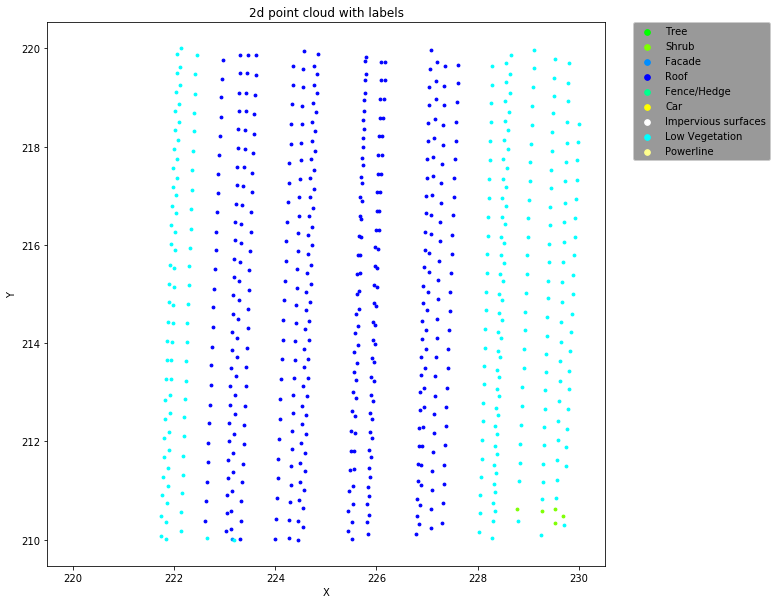

In [3]:
plot_graph_2D(patch2, 
              figsize=(10,10), 
              marksize=8,
              markerscale=2,
              blackBack=False)

# 2 Graph Construction

## 2.1 Adjacency Matrix Construction
### Use the Number of Neighbors

In [4]:
# 30nn, Waussian kernel
W_30nn_Gaussain, _ = gsp.knn_w(cloud=patch2[['x', 'y', 'z']], k=30, dist3D=False, 
                               mode='distance', neightype='number')
# 10nn, Wassian kernel
W_10nn_Gaussain, _ = gsp.knn_w(cloud=patch2[['x', 'y', 'z']], k=10, dist3D=False, 
                               mode='distance', neightype='number')
# 30nn, Binary w
W_30nn_Binary, _   = gsp.knn_w(cloud=patch2[['x', 'y', 'z']], k=30, dist3D=False, 
                               mode='connectivity', neightype='number')
# 10nn, Binary w
W_10nn_Binary, _   = gsp.knn_w(cloud=patch2[['x', 'y', 'z']], k=10, dist3D=False, 
                               mode='connectivity', neightype='number')
# 30nn, Local scalinW
W_30nn_Local, _    = gsp.knn_w(cloud=patch2[['x', 'y', 'z']], k=30, dist3D=False, 
                               mode='local', neightype='number')
# 10nn, Local scalinW
W_10nn_Local, _    = gsp.knn_w(cloud=patch2[['x', 'y', 'z']], k=10, dist3D=False, 
                               mode='local', neightype='number')

### Use the Radius to Look for Neighbors

In [5]:
# r3, Gassian kernel
W_r3_Gaussain, _  = gsp.knn_w(cloud=patch2[['x', 'y', 'z']], r=3, dist3D=False, 
                              mode='distance', neightype='radius')
# r05, Gassian kernel
W_r05_Gaussain, _ = gsp.knn_w(cloud=patch2[['x', 'y', 'z']], r=.5, dist3D=False, 
                              mode='distance', neightype='radius')
# r3, Binary graph
W_r3_Binary, _    = gsp.knn_w(cloud=patch2[['x', 'y', 'z']], r=3, dist3D=False, 
                              mode='connectivity', neightype='radius')
# r05, Binary graph
W_r05_Binary, _   = gsp.knn_w(cloud=patch2[['x', 'y', 'z']], r=.5, dist3D=False, 
                              mode='connectivity', neightype='radius')
# r3, Local scaling
W_r3_Local, _     = gsp.knn_w(cloud=patch2[['x', 'y', 'z']], r=3, dist3D=False, 
                              mode='local', neightype='radius')
# r05, Local scaling
W_r05_Local, _ = gsp.knn_w(cloud=patch2[['x', 'y', 'z']], r=.5, dist3D=False, 
                  mode='local', neightype='radius')
adjacency_list = [W_30nn_Gaussain, W_10nn_Gaussain, W_30nn_Binary, 
                  W_10nn_Binary,   W_30nn_Local,    W_10nn_Local, 
                  W_r3_Gaussain,   W_r05_Gaussain,  W_r3_Binary, 
                  W_r05_Binary,    W_r3_Local,      W_r05_Local]

## 2.2 Graph Construction from Adjacency Matrix

In [6]:
graph_dict = dict.fromkeys(['G_30nn_Gaussain', 'G_10nn_Gaussain', 'G_30nn_Binary', 
                            'G_10nn_Binary',   'G_30nn_Local',    'G_10nn_Local',
                            'G_r3_Gaussain',   'G_r05_Gaussain',  'G_r3_Binary',
                            'G_r05_Binary',    'G_r3_Local',      'G_r05_Local'])
for i, j in zip(graph_dict.keys(), adjacency_list):
    graph_dict[i] = nx.from_scipy_sparse_matrix(j)

# 3 Graph Visualization

In [7]:
# Set the postions and colors of nodes
pos_values = [(i, j) for i, j in zip(patch2.x, patch2.y)]
pos = dict(zip(range(W_30nn_Gaussain.shape[0]), pos_values))
nodecolor = list(patch2['label'] == 5)
nodecolor = ['r' if i else 'b' for i in nodecolor]

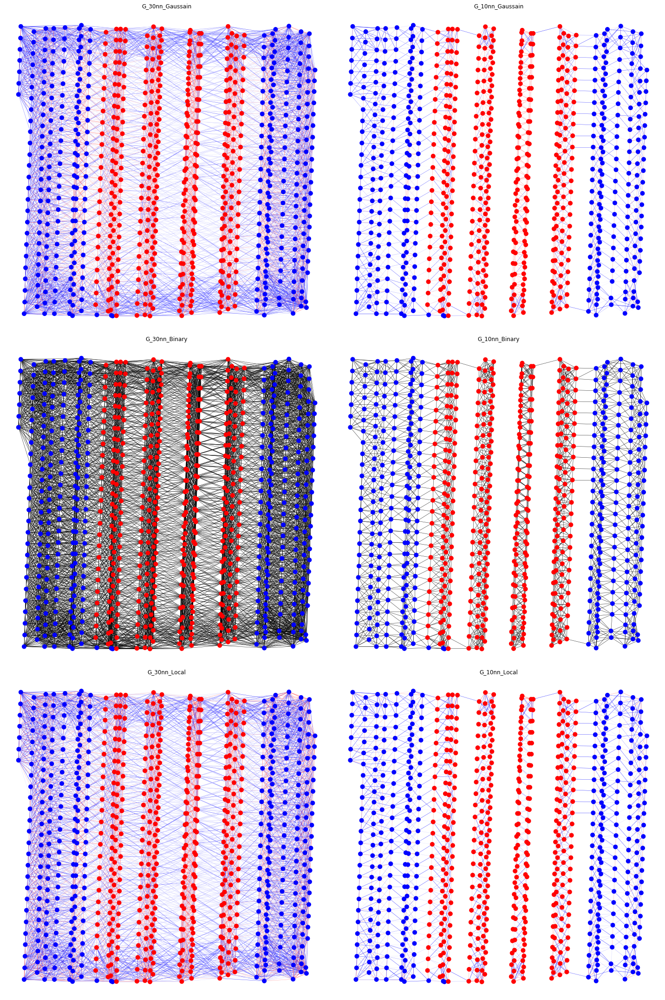

In [8]:
# Visualize the graph
title_list = list(graph_dict.keys())
fig, axes = plt.subplots(3, 2, figsize=(20, 30))
for i, j in zip(list(graph_dict.keys())[:6], range(6)):
    edges,weights = zip(*nx.get_edge_attributes(graph_dict[i], 'weight').items())
    if 'Binary' in i:
        nx.draw(graph_dict[i], 
                pos, 
                node_size=80, 
                node_color=nodecolor, 
                ax=axes[j//2, j%2],
                width=0.5)
    else:
        nx.draw(graph_dict[i], 
                pos, 
                node_size=80, 
                node_color=nodecolor, 
                ax=axes[j//2, j%2],
                width=0.5, 
                edgelist=edges, 
                edge_color=weights, 
                edge_cmap=plt.cm.bwr)
    axes[j//2, j%2].set_title(title_list[j])
plt.tight_layout()
plt.show()

# 4 Choose Radius

In [9]:
# Construct graph from adjacency matrix using different radius
radius_adjacency_keys = []
radius_graph_keys = []
for i in np.linspace(1, 1.5, 6)[:-1]:
    tmp1 = 'W_r{}_Gaussian'.format(i)
    tmp2 = 'W_r{}_Binary'.format(i)
    tmp3 = 'G_r{}_Gaussian'.format(i)
    tmp4 = 'G_r{}_Binary'.format(i)
    radius_adjacency_keys.extend([tmp1, tmp2])
    radius_graph_keys.extend([tmp3, tmp4])

In [10]:
radius_adjacency =dict.fromkeys(radius_adjacency_keys)
radius_graph = dict.fromkeys(radius_graph_keys)
for i, j, r in zip(radius_adjacency_keys, radius_graph_keys, np.repeat(np.linspace(1, 1.5, 6)[:-1], 2)):
    if 'Gaussian' in i:
        radius_adjacency[i], _ = gsp.knn_w(cloud=patch2[['x', 'y', 'z']], 
                                           r=r, 
                                           dist3D=False, 
                                           mode='distance', 
                                           neightype='radius')
    else:
        radius_adjacency[i], _ = gsp.knn_w(cloud=patch2[['x', 'y', 'z']], 
                                           r=r, 
                                           dist3D=False, 
                                           mode='connectivity', 
                                           neightype='radius')   
    radius_graph[j] = nx.from_scipy_sparse_matrix(radius_adjacency[i])

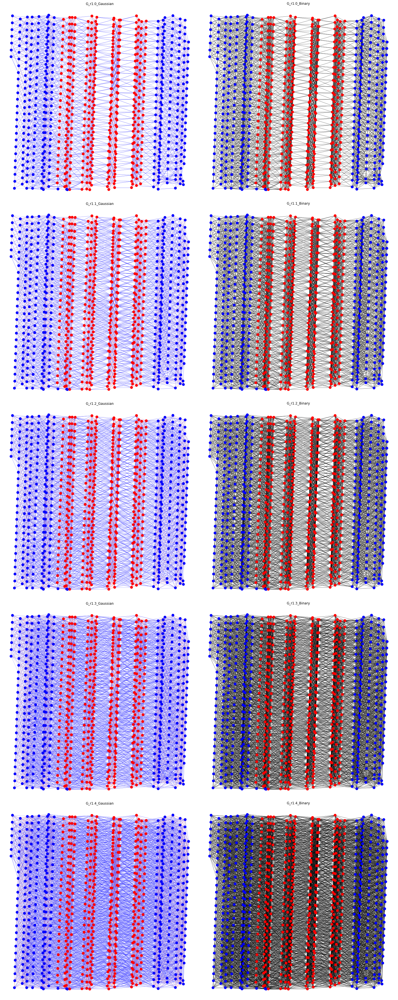

In [11]:
# Visualization
fig, axes = plt.subplots(5, 2, figsize=(20, 50))
for i, j in zip(radius_graph_keys, range(10)):
    edges,weights = zip(*nx.get_edge_attributes(radius_graph[i], 'weight').items())
    if 'Binary' in i:
        nx.draw(radius_graph[i], 
                pos, 
                node_size=80, 
                node_color=nodecolor, 
                ax=axes[j//2, j%2],
                width=0.5)
    else:
        nx.draw(radius_graph[i], 
                pos, node_size=80, 
                node_color=nodecolor, 
                ax=axes[j//2, j%2],
                width=0.5, 
                edgelist=edges, 
                edge_color = weights, 
                edge_cmap=plt.cm.bwr)
    axes[j//2, j%2].set_title(radius_graph_keys[j])
plt.tight_layout()
plt.show()